<Body>   
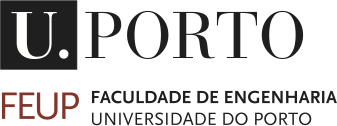   
<h1> <b>Computer Vision </b> </h1>
<p><b>Andry Maykol Pinto </b> (amgp@fe.up.pt)</p>
<p>Department of Electrical and Computer Engineering</p>
</Body>  
FEUP

---

# Transformers for Computer Vision

Visual transformers (ViT) are a promising alternative to traditional Convolutional Neural Network (CNN)-based models. The original research paper that introduced the ViT architecture, ["An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale"](https://arxiv.org/abs/2010.11929), from Google Research Brain Team. The ViT models exhibited a remarkable performance if trained with enough data, since they broke state-of-the-art CNN with (~4x) less computational resources. There are already good variantes, for example the [CSWin (2022)](https://github.com/microsoft/CSWin-Transformer). In addition, many pre-trained ViT models on ImagNet and ImageNet-21k datasets are available in the [repository](https://github.com/google-research/vision_transformer).

-------------------

This lecture will cover the following topics:
* What is a Vision Transformer (ViT)?
* Fundamentals of Attention mechanism and the Transformer architecture.
* How to create a ViT in Pytorch (and how to use Pytorch Lightning)?

This lecture will use a pre-trained model during the theoretical explanations. This model is available at timm which is an open-source collection of state-of-the-art PyTorch image models, pretrained weights, and utility scripts for training, inference, and validation. [Documentation](https://huggingface.co/docs/hub/timm ) and [Code](https://github.com/huggingface/pytorch-image-models/tree/main ) are both available.

 At the end of the lecture, a new ViT model will be designed and trained.

------------




Transformers are a powerful class of models initially developed for natural language processing (NLP) tasks, which have incorporated the attention mechanism to dynamically focus on relevant information and to capture long-range dependencies.

Traditionally, recurrent neural networks (RNNs) were widely used for sequence-to-sequence tasks in NLP. However, transformers offer a novel architecture that avoids the limitations of sequential processing and enables parallelization, resulting in faster and more efficient training. Transformer models have become the *de-facto status quo* in NLP (for example, the popular ChatGPT).  The attention mechanism is the core element of a transformer model since it allows the model to focus on different parts of the input sequence.  This attention mechanism assigns different weights to each word based on its relevance to anoother words in the sequence, enabling the model to attend to the most important information.

In this way, transformers utilize self-attention to capture the dependencies between different words/tokens in the input sequence rather than just relying on recurrent connections like RNNs.

The transformer architecture is formed by:
* an encoder which processes the input sequence;
* a decoder which generates the output sequence.



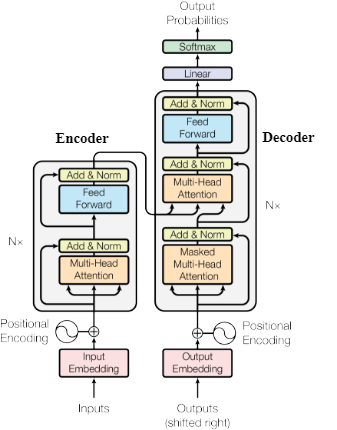

Figure 1. Transformers. Credits: Vaswani et al., 2017

Both the encoder and decoder are composed of multiple layers of self-attention mechanisms and feed-forward neural networks. The self-attention layers allow the model to capture the contextual information and dependencies among the words in the input sequence, while the feed-forward layers help in transforming and mapping this information to an appropriate output representation.

# Visual transformers (ViT) in detail



ViT considers images as sequences of fixed-size patches. It captures the relationships and dependencies between these patches using the power of self-attention. The ViT model is formed by several stages, as can be seen in Figure 2:






![Modules of ViT. Source: https://github.com/lucidrains/vit-pytorch/blob/main/images/vit.gif](https://drive.google.com/uc?export=view&id=1Euwtj_ZMS0HAQFFt0KlijPiawo2Ouwqt)

Figure 1. Modules of ViT (with 9 patches). Credits: Phil Wang.



1. $\color{yellow}{Patch\text{ }Extraction}$: The input image is divided into a grid of fixed-size non-overlapping patches. Each patch represents a local image region. The patches are then flattened and linearly projected to obtain embedding vectors. This is a preprocessing stage formed by a linear projection of image patches.

2. $\color{yellow}{Positional\text{ } Embeddings}$: Similar to the original transformer model, ViT incorporates positional embeddings. These embeddings encode the spatial information of the patches and help the model understand the relative positions of different patches in the image. Positional embeddings are added to the patch embeddings, resulting in combined representations.

3. $\color{yellow}{Classification\text{ } Token}$: ViT introduces a learnable classification token, which is a special token appended to the sequence of patch embeddings. This token acts as the representation of the entire image and is used for classification tasks.

4. $\color{yellow}{Transformer\text{ } encoder}$: The core of ViT consists of multiple layers of transformer encoders. Each encoder layer consists of a multi-head self-attention mechanism and position-wise feed-forward neural networks. The self-attention mechanism captures the relationships between the patch embeddings, allowing the model to attend to relevant patches and gather context information. The feed-forward networks transform and integrate the contextualized information.

5. $\color{yellow}{Linear\text{ } Projection}$: The output of the final transformer encoder layer is linearly projected to a smaller dimension. This projection reduces the dimensionality of the representations and prepares them for classification.

6. $\color{yellow}{Classification\text{ } Head}$: A standard classification head, typically comprising one or more fully connected layers, is attached to the projected representations. The classification head maps the image-level representation to the desired number of output classes and produces the final predictions.

## Prepare Libraries and Folders

In [1]:
#Import the relevant packages:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torch.optim as optim

## Torchvision
import torchvision
from torchvision.datasets import CIFAR10
from torchvision import transforms

# PyTorch Lightning (see link below)
try:
    import pytorch_lightning as pl
except ModuleNotFoundError: # Google Colab does not have PyTorch Lightning installed by default. Hence, we do it here if necessary
    !pip install --quiet pytorch-lightning>=1.4
    import pytorch_lightning as pl
from pytorch_lightning.callbacks import LearningRateMonitor, ModelCheckpoint

# Import tensorboard for logging. The directory for the log file needs to be specified '$tensorboard --logdir='
%load_ext tensorboard

In [2]:
# Other libraries
import os
import numpy as np
import random
import math
import json
from functools import partial
from PIL import Image

## Imports for plotting
import matplotlib.pyplot as plt
plt.set_cmap('inferno')
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('svg', 'pdf') # For export
from matplotlib.colors import to_rgb
import matplotlib
matplotlib.rcParams['lines.linewidth'] = 2.0
import seaborn as sns
sns.reset_orig()

## tqdm for loading bars
from tqdm.notebook import tqdm

<ipython-input-2-5309ff27465c>:15: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('svg', 'pdf') # For export


<Figure size 640x480 with 0 Axes>

Create a folder in the root of your google drive:

* $\color{green}{CV\_MEEC\_2023}$

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

# Path to the folder where the datasets are/should be downloaded (e.g. CIFAR10)
#DATASET_PATH = "/home/data"
DATASET_PATH = "/content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/data"

# Path to the folder where the pretrained models are saved
#CHECKPOINT_PATH = "/home/saved_models/tutorial15"
CHECKPOINT_PATH ="/content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/ViT_Original/"

# Setting the seed
pl.seed_everything(42)

# Ensure that all operations are deterministic on GPU (if used) for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
print("Device:", device)

INFO:lightning_fabric.utilities.seed:Global seed set to 42


Mounted at /content/gdrive
Device: cuda:0


## Prepare Dataset (CIFAR10)

100%|██████████| 170498071/170498071 [00:05<00:00, 28535991.70it/s]


Extracting /content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/data/cifar-10-python.tar.gz to /content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/data
Files already downloaded and verified


INFO:lightning_fabric.utilities.seed:Global seed set to 42
INFO:lightning_fabric.utilities.seed:Global seed set to 42


Files already downloaded and verified


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


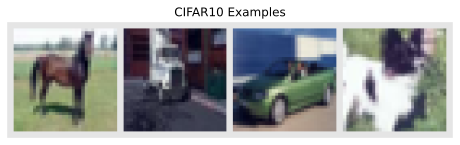

In [4]:
# Data augmentation for training.
train_transform = transforms.Compose([transforms.RandomHorizontalFlip(),
                                      transforms.RandomResizedCrop((32,32),scale=(0.8,1.0),ratio=(0.9,1.1)),
                                      transforms.ToTensor(),
                                      transforms.Normalize([0.49139968, 0.48215841, 0.44653091], [0.24703223, 0.24348513, 0.26158784])
                                     ])
# Data normalization for testing.
test_transform = transforms.Compose([transforms.ToTensor(),
                                     transforms.Normalize([0.49139968, 0.48215841, 0.44653091], [0.24703223, 0.24348513, 0.26158784])
                                     ])

# Loading the training set.
train_dataset = CIFAR10(root=DATASET_PATH, train=True, transform=train_transform, download=True)
# Loading the validation set (should not use the augmentation).
val_dataset = CIFAR10(root=DATASET_PATH, train=True, transform=test_transform, download=True)

pl.seed_everything(42)
train_set, _ = torch.utils.data.random_split(train_dataset, [45000, 5000])
pl.seed_everything(42)
_, val_set = torch.utils.data.random_split(val_dataset, [45000, 5000])

# Loading the test set.
test_set = CIFAR10(root=DATASET_PATH, train=False, transform=test_transform, download=True)

# Dataloaders.
train_loader = data.DataLoader(train_set, batch_size=128, shuffle=True, drop_last=True, pin_memory=True, num_workers=4)
val_loader   = data.DataLoader(val_set, batch_size=128, shuffle=False, drop_last=False, num_workers=4)
test_loader  = data.DataLoader(test_set, batch_size=128, shuffle=False, drop_last=False, num_workers=4)

# Visualize some examples
NUM_IMAGES = 4
CIFAR_images = torch.stack([val_set[idx][0] for idx in range(NUM_IMAGES)], dim=0)
img_grid = torchvision.utils.make_grid(CIFAR_images, nrow=4, normalize=True, pad_value=0.9)
img_grid = img_grid.permute(1, 2, 0)

plt.figure(figsize=(8,8))
plt.title("CIFAR10 Examples")
plt.imshow(img_grid)
plt.axis('off')
plt.show()
plt.close()

In [5]:
# Patching using Pytorch
def img_to_patch(x, patch_size, flatten_channels=True):
    """
    Inputs:
        x - torch.Tensor representing the image of shape [B, C, H, W]
        patch_size - Number of pixels per dimension of the patches (integer)
        flatten_channels - If True, the patches will be returned in a flattened format
                           as a feature vector instead of a image grid.
    """
    B, C, H, W = x.shape
    x = x.reshape(B, C, H//patch_size, patch_size, W//patch_size, patch_size)
    x = x.permute(0, 2, 4, 1, 3, 5) # [B, H', W', C, p_H, p_W]
    x = x.flatten(1,2)              # [B, H'*W', C, p_H, p_W]
    if flatten_channels:
        x = x.flatten(2,4)          # [B, H'*W', C*p_H*p_W]
    return x

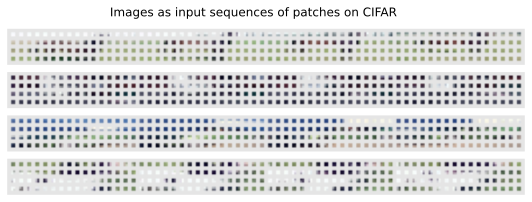

In [6]:
#Testing the previous patching implementation on CIFAR dataset
img_patches = img_to_patch(CIFAR_images, patch_size=2, flatten_channels=False)

# Show the image patches for CIFAR
fig, ax = plt.subplots(CIFAR_images.shape[0], 1, figsize=(14,3))
fig.suptitle("Images as input sequences of patches on CIFAR")
for i in range(CIFAR_images.shape[0]):
    img_grid = torchvision.utils.make_grid(img_patches[i], nrow=64, normalize=True, pad_value=0.9)
    img_grid = img_grid.permute(1, 2, 0)
    ax[i].imshow(img_grid)
    ax[i].axis('off')
plt.show()
plt.close()

## Loading a ViT model for demonstration

The ViT model used is available on [timm](https://github.com/rwightman/pytorch-image-models/blob/198f6ea0f3dae13f041f3ea5880dd79089b60d61/timm/models/vision_transformer.py#L79-L143).


In [7]:
%%capture
!pip install timm
from timm import create_model

model_name = "vit_base_patch16_224"
# create a ViT model : https://github.com/rwightman/pytorch-image-models/blob/master/timm/models/vision_transformer.py
model = create_model(model_name, pretrained=True).to(device)

# Define transforms for test
IMG_SIZE = (224, 224)
NORMALIZE_MEAN = (0.5, 0.5, 0.5)
NORMALIZE_STD = (0.5, 0.5, 0.5)
do_transform = [
              transforms.Resize(IMG_SIZE),
              transforms.ToTensor(),
              transforms.Normalize(NORMALIZE_MEAN, NORMALIZE_STD),
              ]

do_transform = transforms.Compose(do_transform)

In [8]:
%%capture
# ImageNet Labels
!wget https://storage.googleapis.com/bit_models/ilsvrc2012_wordnet_lemmas.txt
imagenet_labels = dict(enumerate(open('ilsvrc2012_wordnet_lemmas.txt')))

# Demo Image
!wget https://paginas.fe.up.pt/~falves/biblioteca1.JPG -O feup_pic.jpg
img = Image.open('feup_pic.jpg')

img_tensor = do_transform(img).unsqueeze(0).to(device)

In more details, this ViT model has the following specification (see figure 2):

* The input image is split into 14 x 14 vectors, with dimension of 768 by Conv2d (k=16x16) with stride=(16, 16).
* Learnable position embedding with dimension 768 x 197 is added to the patch embedding vectors and fed to the transformer encoder.
* In the transformer encoder, the dimension of input and output vectors are the same (768 x 197).
* The 0th output from the encoder is fed to the MLP head for classification to output the final classification results.

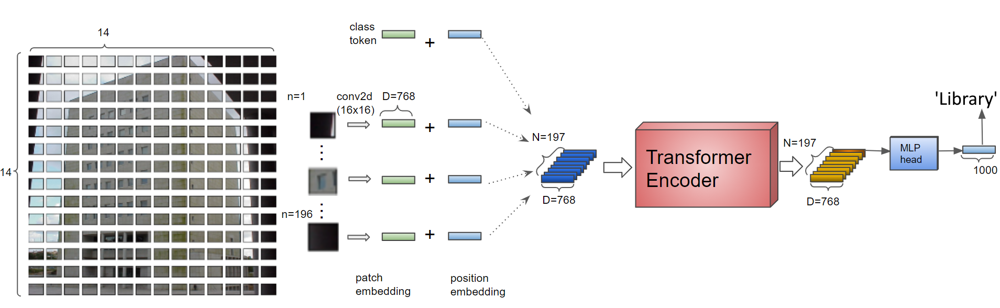

Figure 2. ViT model loaded for demonstration.

In [9]:
# do the inference
output = model(img_tensor)

Inference Result:
library



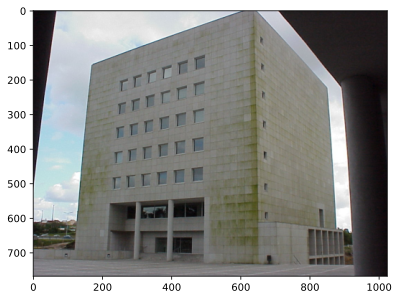

In [10]:
# show inference result and image
print("Inference Result:")
print(imagenet_labels[int(torch.argmax(output))])
plt.imshow(img)

## 1)  $\color{yellow}{Patch \text{ } Extraction}$

The first stage of ViT is to divide an image into multiple patches. This approach is presented in the paper ''An Image is Worth 16x16 Words: Transformers for Image Recognition at Scale''.
> an image is divided into $9 \times 9$ (or $14 \times 14$ or even $16 \times 16$) patches.

> the embedding vector is obtained by a linear projection of each patch.


In our ViT model, the input image is splitted into N patches (N = 14 x 14)
and converted to D = 768 embedding vectors by learnable 2D convolution:

```
Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
```

--2023-09-14 11:32:30--  https://paginas.fe.up.pt/~falves/biblioteca1.JPG
Resolving paginas.fe.up.pt (paginas.fe.up.pt)... 104.18.6.105, 104.18.7.105, 2606:4700::6812:669, ...
Connecting to paginas.fe.up.pt (paginas.fe.up.pt)|104.18.6.105|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 102204 (100K) [image/jpeg]
Saving to: ‘feup_pic.jpg’

feup_pic.jpg        100%[===================>]  99.81K  --.-KB/s    in 0.004s  

2023-09-14 11:32:30 (22.0 MB/s) - ‘feup_pic.jpg’ saved [102204/102204]



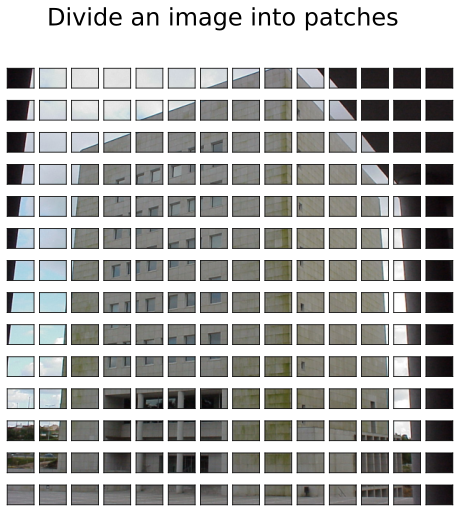

In [11]:
import PIL
def img_show_patch(img, patch_size):
    fig = plt.figure(figsize=(8, 8))
    fig.suptitle("Divide an image into patches", fontsize=24)
    img = np.asarray(img)
    step_y = int((img.shape[0]/(patch_size)))
    step_x = int((img.shape[1]/(patch_size)))
    i = 0

    for iy in range(0, patch_size):
        iy_end = (iy+1)*step_y -1
        for ix in range(0, patch_size):
            ix_end = (ix+1)*step_x-1
            patch = img[iy*step_y:iy_end, ix*step_x:ix_end]
            ax = fig.add_subplot(patch_size, patch_size, i+1)
            ax.axes.get_xaxis().set_visible(False)
            ax.axes.get_yaxis().set_visible(False)
            if patch.any():
              ax.imshow(patch)
            i = i + 1

# See an example of patching
!wget https://paginas.fe.up.pt/~falves/biblioteca1.JPG -O feup_pic.jpg
img_temp = PIL.Image.open('feup_pic.jpg')
img_show_patch(img_temp, 14)

In [12]:
patches = model.patch_embed(img_tensor)  # patch embedding convolution
print("Image tensor: ", img_tensor.shape)
print("Patch embeddings: ", patches.shape)

Image tensor:  torch.Size([1, 3, 224, 224])
Patch embeddings:  torch.Size([1, 196, 768])


## 2)   $\color{yellow}{Classification \text{ } Token}$

A classification token that is added to the input sequence. This CLS patch will be used for determining the classification prediction.

* The CLS is a learnable class token is prepended to the patch embedding vectors as the 0th vector.  

Therefore, the patch embedding vector increases of size by +1.


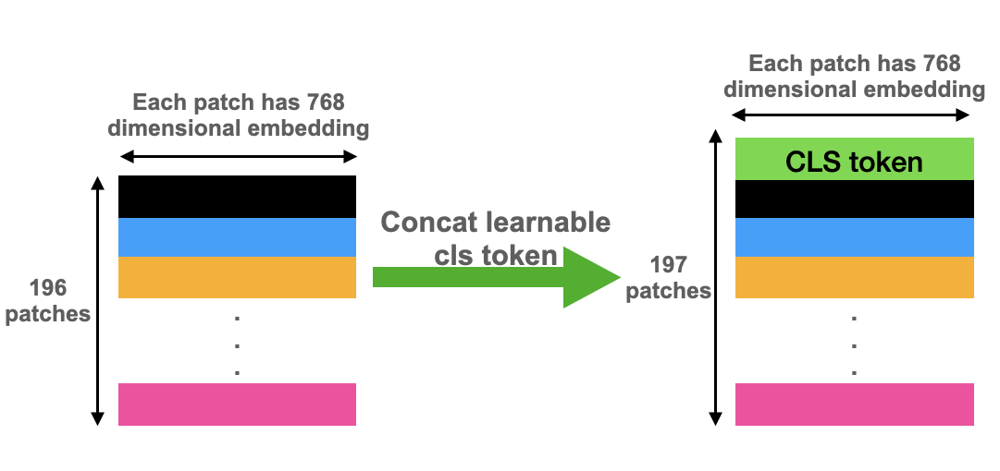
Figure 4 - Adding the CLS token on top of the patch embedding vectors. Credits: OpenCV

 In terms of tensor sizes, continuing with our example of an image, the size after concatenation was:

In [13]:
pos_embed = model.pos_embed
transformer_input = torch.cat((model.cls_token, patches), dim=1) + pos_embed
print("Transformer input: ", transformer_input.shape)

Transformer input:  torch.Size([1, 197, 768])


## 3) $\color{yellow}{Positional \text{ } Embeddings}$

Positional encoding addresses the inherent limitation of self-attention mechanisms, which do not inherently consider the order or position of elements in a sequence, like words in a sentence or tokens in a document. Multi-Head Attention block (it will be discussed soon) is permutation-equivariant: invariant to reordering of the input and thus, it cannot distinguish whether an input comes before another one in the sequence.

Positional encoding ensures that transformers can capture sequential information and understand the relative positions of elements within a sequence.
The position of patches is important for interpreting the input words and, therefore, the *position information needs to be added* via the input features (e.g., using the Injection Method):
* Absolute Position Encodings;
* Relative Position Encodings.

For the sake of simplicity, lets consider that is possible to:
* learn an embedding for every possible position, but this would not generalize to a dynamical input sequence length)
* use feature patterns that the network can identify from the features and potentially generalize to larger sequences.

There are many strategies for positional encoding. The positional encodings can be created using sine-cosine functions of different frequencies. These functions are non-trainable and have the properties of being periodic which allows the model to capture both local and global positional information.

$
\begin{split}PE_{(pos,i)} = \begin{cases}
    \sin\left(\frac{pos}{10000^{i/d_{\text{model}}}}\right) & \text{if}\hspace{3mm} i \text{ mod } 2=0\\
    \cos\left(\frac{pos}{10000^{(i-1)/d_{\text{model}}}}\right) & \text{otherwise}\\
\end{cases}\end{split}
$

where 'pos' is the position (index) for the word in the sequence and 'i' is the hidden dimensionality and '$d_{model}$' is the dimension of the output embedding space.


An unique pattern for a specific word is obtained by increasing "i".
The ‘PE’ formula applies the sine function for even embedding indexes (‘i’) and the cosine function for odd embedding indexes.


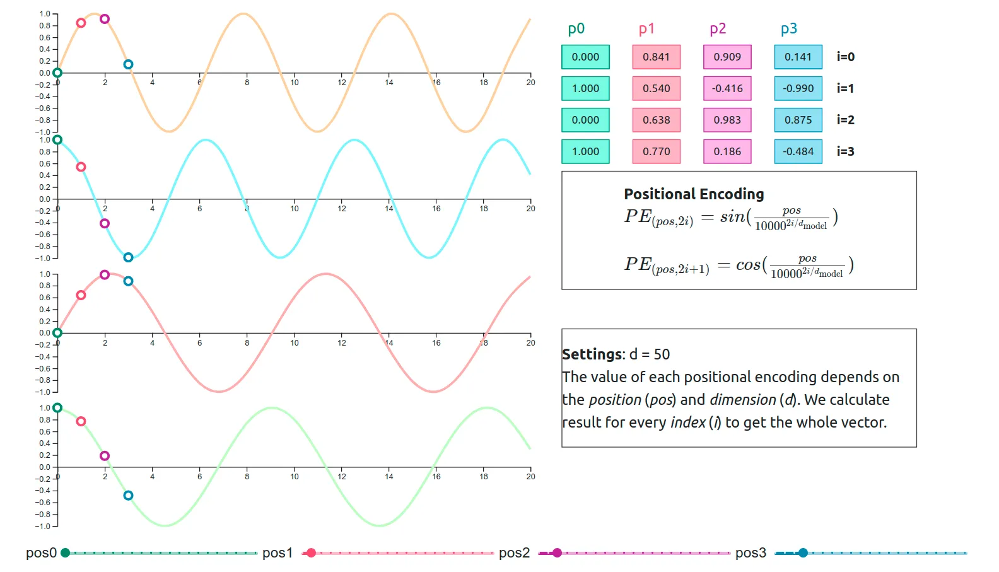

Figure 3 - Sin-Cosine positional encoding. Credits “Attention Is All You Need”, NeurIPS 2017.


To make patches position-aware, learnable 'position embedding' vectors are added to the patch embedding vectors. The position embedding vectors learn distance within the image thus neighboring ones have high similarity. Thus,  the position embedding parameter is instantiated to be of the same size and it is added element-wise to the patches.

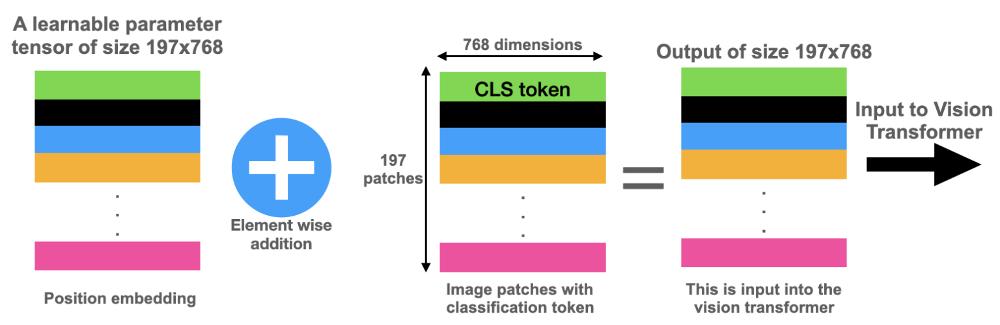

Figure 5 - Positional Embedding. Credits: OpenCV

The positional embedding can be implemented using Pytorch.

In [14]:
class PositionalEncoding(nn.Module):

    def __init__(self, d_model, max_len=5000):
        """
        Inputs
            d_model - Hidden dimensionality of the input.
            max_len - Maximum length of a sequence to expect.
        """
        super().__init__()

        # Create matrix of [SeqLen, HiddenDim] representing the positional encoding for max_len inputs
        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)

        # register_buffer => Tensor which is not a parameter, but should be part of the modules state.
        # Used for tensors that need to be on the same device as the module.
        # persistent=False tells PyTorch to not add the buffer to the state dict (e.g. when we save the model)
        self.register_buffer('pe', pe, persistent=False)

    def forward(self, x):
        x = x + self.pe[:, :x.size(1)]
        return x

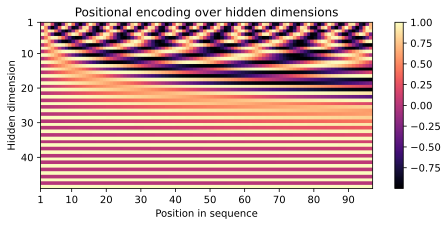

In [15]:
# show the result of the positional encoding for multiple dimensions.

encod_block = PositionalEncoding(d_model=48, max_len=96)
pe = encod_block.pe.squeeze().T.cpu().numpy()

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,3))
pos = ax.imshow(pe, cmap="magma", extent=(1,pe.shape[1]+1,pe.shape[0]+1,1))
fig.colorbar(pos, ax=ax)
ax.set_xlabel("Position in sequence")
ax.set_ylabel("Hidden dimension")
ax.set_title("Positional encoding over hidden dimensions")
ax.set_xticks([1]+[i*10 for i in range(1,1+pe.shape[1]//10)])
ax.set_yticks([1]+[i*10 for i in range(1,1+pe.shape[0]//10)])
plt.show()

Value is calculated alternately with the help of the periodic functions, where the wavelength increases with higher dimensions of the input vector.
Lower indexes lead to a rapid variation of the values and, at contrary, higher indexes of the hidden dimension need a significant change of positions to alter the value.

In a ViT model, the positional encoding can be visualized as:

In [16]:
# dimension of the PE for injection
print(pos_embed.shape)

torch.Size([1, 197, 768])


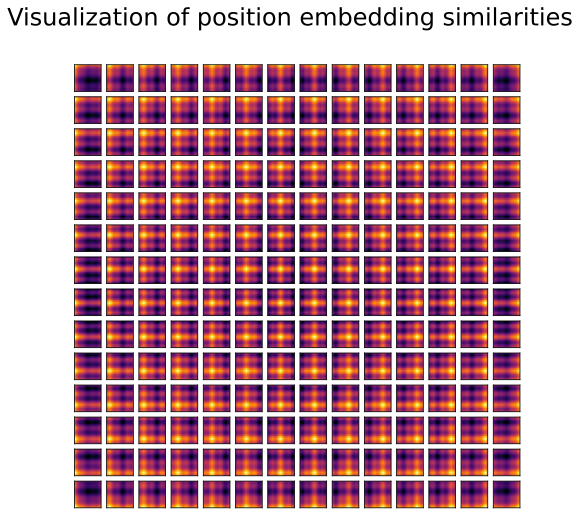

In [17]:
# Visualize position embedding similarities.
# One cell shows cos similarity between an embedding and all the other embeddings.
cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
fig = plt.figure(figsize=(8, 8))
fig.suptitle("Visualization of position embedding similarities", fontsize=24)
for i in range(1, pos_embed.shape[1]):
    sim = F.cosine_similarity(pos_embed[0, i:i+1], pos_embed[0, 1:], dim=1)
    sim = sim.reshape((14, 14)).detach().cpu().numpy()
    ax = fig.add_subplot(14, 14, i)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.imshow(sim)

## Fundamentals of Transformers

The Transformer model is one of the most impactful architectures of deep learning from the last years.


### Introduction to Self Attention Mechanism

The attention mechanism has appeared in the context of NLP to deal with the problem of modeling very long sequences using RNNs (and even LSTMs).
> In a sentence, which previous words should we pay attention to when predicting the next word?

The attention mechanism is used to **capture long-range dependencies and contextual information** in the input data.
It enables the model to weigh the relevance (through attention scores) of different parts (words or tokens) of an input sequence. These attention scores reflect the model's attention or focus on specific words during processing and captures dependencies between different tokens of the sequence.  



There are many different definitions of "attention" in the literature. The attention mechanism in transformers is often referred to as "self-attention" or "scaled dot-product attention", and it operates on three main components:

>* **$\color{yellow}{Queries}$** represent the current position (or word) for which the model wants to compute attention weights (*what we maybe want to pay attention to*).

>* $\color{yellow}{Keys}$ represent all the positions (or words) in the input sequence. They are used to determine the relevance of each position to the current query.

>* $\color{yellow}{Values}$ contain the information or features associated with each position (or word) in the sequence. They are used to compute the weighted sum of the values based on the attention scores obtained from the queries and keys.


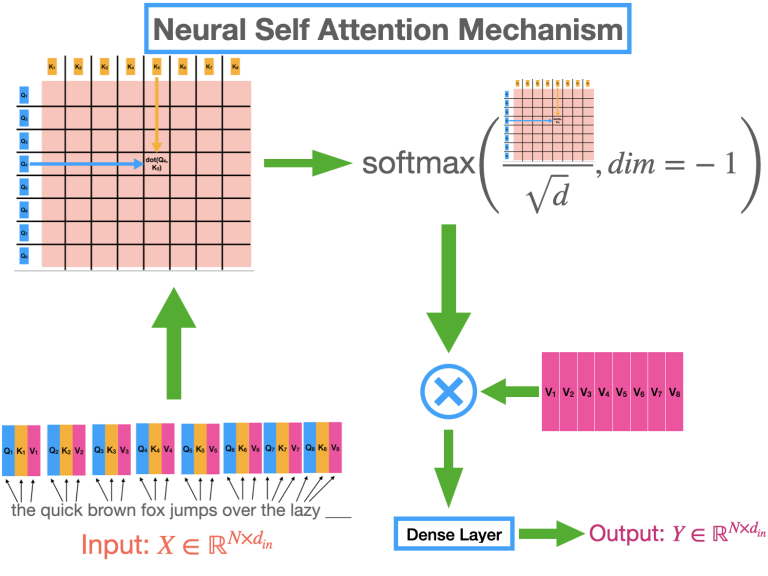

Figure 2. Self-Attention mechanism. Image credits: LearnOpenCV.

The attention mechanism which describes a weighted average of (sequence) elements with the weights dynamically computed based on an input query and elements' keys, involves **three main steps**:
1. $\color{orange}{Computing\textit{ }Attention \textit{ }Scores}$: they are calculated by measuring the similarity between each **query and key**. This is typically done by taking the **dot product** (or a small MLP) between the query and key vectors, and applying a **softmax function** to obtain normalized attention weights. The dot product captures the semantic similarity between the query and key.
2. $\color{orange}{Weighted\textit{ } Sum\textit{ } of\textit{ } Values}$: the attention scores are computed are **multiplied with the corresponding values** to obtain weighted representations. These weighted representations emphasize the information that is most relevant to the current query.

3. $\color{orange}{Combining\textit{ } the\textit{ } Weighted\textit{ } Representations}$: the weighted representations from different positions in the sequence are then summed together to create the final output of the attention mechanism. This output captures the contextual information and dependencies between the words in the sequence.

Terminology:
*  $Q \in R^{N \times d_{att}}$ as a set of queries;
*  $K \in R^{N \times d_{att}}$ as a set of keys;
*  $V \in R^{N \times d_{att}}$ as a set of values;
* N is the sequence length;
* $d_{att}$ is the dimension of the key, query, and value vectors (a hyperparameter). The Q, K and V can have different dimensions;
* $ X = \left[X_1, ..., X_N \right] \in R^{N \times d_{in}}$;
* $d_{in}$ is the feature dimension for the input data. Usually, $d_{att} < d_{in}$.




**Steps 1 to 2** are obtained by:

The Q, K and V matrices are first calculated as a linear combination with matrices $W_Q$, $W_K$, $W_V$, respectively. Where $W_i \in R^{d_{din} \times d_{att}}$ and $i \in \{Q, K, V\}$.

\begin{equation}
Q = X \cdot W_Q
\end{equation}

\begin{equation}
K = X \cdot W_K
\end{equation}

\begin{equation}
V = X \cdot W_V
\end{equation}


Thus, the dot product attention is calculated as:

$\color{green}{
Attention (Q, K, V) = sofmax (\frac{QK^T}{\sqrt{d_{att}}})V}$




> 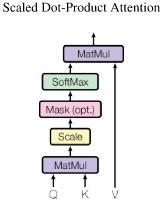

Figure 3. Graphical representation of the self attention. Credit: Vaswani et al., 2017

Where $\color{green}{Attention}$$\in R^{N \times d_{att}}$:

> The **dot product is used as a similarity metric** of the query $Q_i$ and the key $K_j$. $QK^T$ is performing the dot product for every possible pair of queries and keys, including the self values ($i=j$).

> The scaling factor $\frac{1}{\sqrt{d_{att}}}$ maintains the variance of the attention velues after initialization (keeping equal variance throughout the model). Without scalling, the gradients of the softmax will be close to zero (the model wont be able to learn the parameters).

> The softmax is used for scalling the result of the dot product, which is later multiplied by the V (values vector) to obtain the weighted mean  (where the weights were calculated by the attention).





### Multi-Head Attention
The attention mechanism is typically applied multiple times in parallel, where each instance is referred to as an "attention head." This allows the model to attend to different aspects of the input sequence simultaneously, capturing various types of information. The outputs of multiple attention heads are usually concatenated or linearly combined to form the final representation.

Given Q, V, and K matrix, we transform into h sub-queries, sub-keys and sub-values, which are converted into sub-attentions, independently. At the end, we concatenate the output of the heads into a final weight matrix.



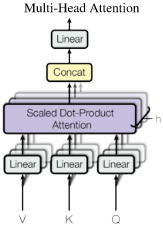

Figure 4. Multi-head Self Attention Mechanism. Credits: Vaswani et al., 2017

\begin{equation}\color{green}{
MHSA (Q, k, V) = concat(head_1, ..., head_h) W^o}
\end{equation}
\begin{equation}\color{green}{
where\text{ } head_i = Attention(QW_i^Q, KW_i^K, VW_i^V)}
\end{equation}


The learning parameters are:
* $W_{i... h}^Q$, $W_{i... h}^K$, $W_{i... h}^V \in R^{d_{in} \times d_{att}}$;
* $W^o \in R^{h.d_{att} \times d_{out}}$;


In [18]:
print("Transformer Multi-head Attention block:")
attention = model.blocks[0].attn
print(attention)
print("input of the transformer encoder:", transformer_input.shape)

Transformer Multi-head Attention block:
Attention(
  (qkv): Linear(in_features=768, out_features=2304, bias=True)
  (q_norm): Identity()
  (k_norm): Identity()
  (attn_drop): Dropout(p=0.0, inplace=False)
  (proj): Linear(in_features=768, out_features=768, bias=True)
  (proj_drop): Dropout(p=0.0, inplace=False)
)
input of the transformer encoder: torch.Size([1, 197, 768])


In [19]:
# fc layer to expand the dimension
transformer_input_expanded = attention.qkv(transformer_input)[0]
print("expanded to: ", transformer_input_expanded.shape)

expanded to:  torch.Size([197, 2304])


In [20]:
# Split qkv into mulitple q, k, and v vectors for multi-head attantion
qkv = transformer_input_expanded.reshape(197, 3, 12, 64)  # (N=197, (qkv), H=12, D/H=64)
print("split qkv : ", qkv.shape)
q = qkv[:, 0].permute(1, 0, 2)  # (H=12, N=197, D/H=64)
k = qkv[:, 1].permute(1, 0, 2)  # (H=12, N=197, D/H=64)
kT = k.permute(0, 2, 1)  # (H=12, D/H=64, N=197)
print("transposed ks: ", kT.shape)

split qkv :  torch.Size([197, 3, 12, 64])
transposed ks:  torch.Size([12, 64, 197])


In [21]:
# Attention Matrix
attention_matrix = q @ kT
#print("attention matrix: ", attention_matrix.shape)
#plt.imshow(attention_matrix[3].detach().cpu().numpy())

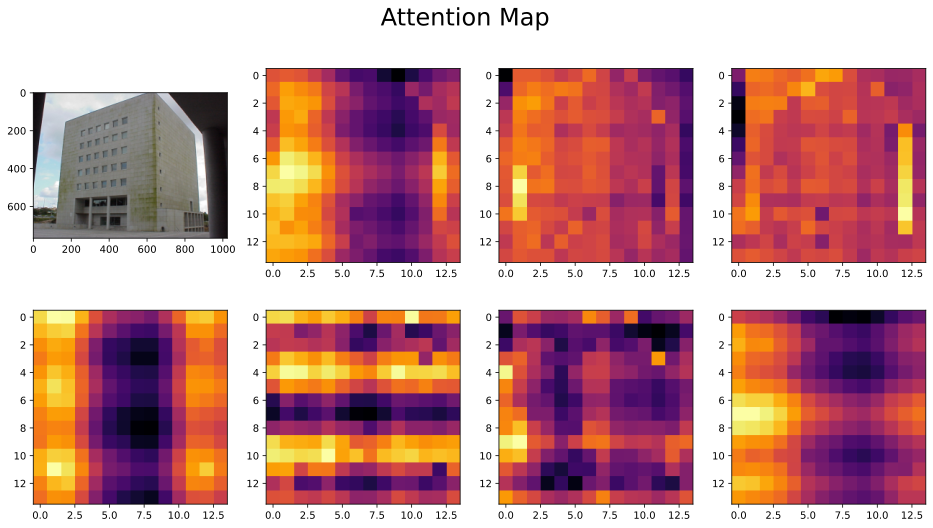

In [22]:
# Show Attention Map
fig = plt.figure(figsize=(16, 8))
fig.suptitle("Attention Map", fontsize=24)
#fig.add_axes()
img = np.asarray(img)
ax = fig.add_subplot(2, 4, 1)
ax.imshow(img)
for i in range(7):  # visualize the 100th rows of attention matrices in the 0-7th heads
    attn_heatmap = attention_matrix[i, 100, 1:].reshape((14, 14)).detach().cpu().numpy()
    ax = fig.add_subplot(2, 4, i+2)
    ax.imshow(attn_heatmap)

In [23]:
# An example of the MultiheadAttention
# (to be considered as pseudocode):
# Credits: Phillip Lippe, 2022

# We will use the Pytorch implementation and not this one!

def scaled_dot_product(q, k, v, mask=None):
    d_k = q.size()[-1]
    attn_logits = torch.matmul(q, k.transpose(-2, -1))
    attn_logits = attn_logits / math.sqrt(d_k)

    if mask is not None:
        attn_logits = attn_logits.masked_fill(mask == 0, -9e15)
    attention = F.softmax(attn_logits, dim=-1)
    values = torch.matmul(attention, v)

    return values, attention


class MultiheadAttention(nn.Module):

    def __init__(self, input_dim, embed_dim, num_heads):
        super().__init__()
        assert embed_dim % num_heads == 0, "Embedding dimension must be 0 modulo number of heads."

        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.head_dim = embed_dim // num_heads

        # Stack all weight matrices 1...h together for efficiency
        # Note that in many implementations you see "bias=False" which is optional
        self.qkv_proj = nn.Linear(input_dim, 3*embed_dim)
        self.o_proj = nn.Linear(embed_dim, embed_dim)

        self._reset_parameters()

    def _reset_parameters(self):
        # Original Transformer initialization, see PyTorch documentation
        nn.init.xavier_uniform_(self.qkv_proj.weight)
        self.qkv_proj.bias.data.fill_(0)
        nn.init.xavier_uniform_(self.o_proj.weight)
        self.o_proj.bias.data.fill_(0)

    def forward(self, x, mask=None, return_attention=False):
        batch_size, seq_length, _ = x.size()
        qkv = self.qkv_proj(x)

        # Separate Q, K, V from linear output
        qkv = qkv.reshape(batch_size, seq_length, self.num_heads, 3*self.head_dim)
        qkv = qkv.permute(0, 2, 1, 3) # [Batch, Head, SeqLen, Dims]
        q, k, v = qkv.chunk(3, dim=-1)

        # Determine value outputs
        values, attention = scaled_dot_product(q, k, v, mask=mask)
        values = values.permute(0, 2, 1, 3) # [Batch, SeqLen, Head, Dims]
        values = values.reshape(batch_size, seq_length, self.embed_dim)
        o = self.o_proj(values)

        if return_attention:
            return o, attention
        else:
            return o

## 4) $\color{yellow}{Transformer\text{ } encoder}$.

It consists of Nx identical blocks (e.g., Nx > 24). These blocks are applied in sequence. In each block:
1. the input $x$ is passed through a Multi-head attention block.
2. the output is added to the input $x$ using a residual connection. The residual connection enables a smoother gradient flow and preserves the position of elements in a sequence.  
3. the LayerNorm is applied to the result of the residual connection. This layers accelerates the training and provides small regularization.
4. the fully connected feed-foward network (FFN). The model uses: Linear - GeLU - Linear MLP (2 to 8x larger than the dimensionality of the original input $x$).
5. the LayerNorm is applied to the residual connection of the result of FNN with the input of the FFN.



Pytorch has several layers available that are able to implement an encoder with multiple-head attention.
* `nn.LayerNorm` applies Layer Normalization over a mini-batch of inputs [(more information)](https://pytorch.org/docs/stable/generated/torch.nn.LayerNorm.html).
* `nn.MultiheadAttention` attends to information from different representation subspaces  [(more information)](https://pytorch.org/docs/stable/generated/torch.nn.MultiheadAttention.html).
* `nn.GELU` applies the Gaussian Error Linear Units function [(more information)](https://pytorch.org/docs/stable/generated/torch.nn.GELU.html).


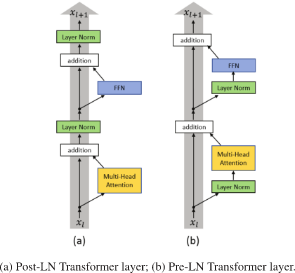

Figure 6: a) Post-LayerNorm (original);  b) Pre-LayerNorm (implemented). Credits: Pillip Lippe.

In this lecture, we will use the **Pre-Layer Normalization** version of the Transformer blocks proposed by [Ruibin Xiong et al. in 2020](http://proceedings.mlr.press/v119/xiong20b/xiong20b.pdf), which reorganizes the sequence of layers to provide a better gradient flow and to remove the warm-up stage.

------------------------

In [24]:
print("Input tensor to Transformer (z0): ", transformer_input.shape)
x = transformer_input.clone()
for i, blk in enumerate(model.blocks):
    print("Entering the Transformer Encoder {}".format(i))
    x = blk(x)
x = model.norm(x)
transformer_output = x[:, 0]
print("Output vector from Transformer (z12-0):", transformer_output.shape)

Input tensor to Transformer (z0):  torch.Size([1, 197, 768])
Entering the Transformer Encoder 0
Entering the Transformer Encoder 1
Entering the Transformer Encoder 2
Entering the Transformer Encoder 3
Entering the Transformer Encoder 4
Entering the Transformer Encoder 5
Entering the Transformer Encoder 6
Entering the Transformer Encoder 7
Entering the Transformer Encoder 8
Entering the Transformer Encoder 9
Entering the Transformer Encoder 10
Entering the Transformer Encoder 11
Output vector from Transformer (z12-0): torch.Size([1, 768])


## 5) $\color{yellow}{Classification\text{ } head}$.

Classification head:  Linear(in_features=768, out_features=1000, bias=True)
Inference result : id = 624, label name = library



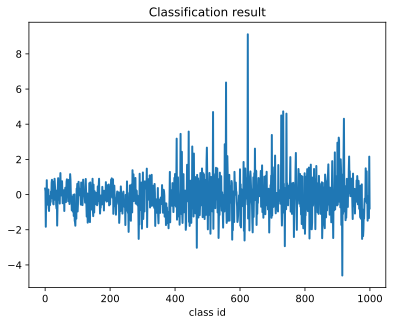

In [25]:
# MLP Classification Head
print("Classification head: ", model.head)
result = model.head(transformer_output)
result_label_id = int(torch.argmax(result))
plt.plot(result.detach().cpu().numpy()[0])
plt.title("Classification result")
plt.xlabel("class id")
print("Inference result : id = {}, label name = {}".format(
    result_label_id, imagenet_labels[result_label_id]))

# Creating a ViT model using Pytorch

In [26]:
class AttentionBlock(nn.Module):
    def __init__(self, embed_dim, hidden_dim, num_heads, dropout=0.0):
        """
        Inputs:
            embed_dim - Dimensionality of input and attention feature vectors
            hidden_dim - Dimensionality of hidden layer in feed-forward network
                         (usually 2-4x larger than embed_dim)
            num_heads - Number of heads to use in the Multi-Head Attention block
            dropout - Amount of dropout to apply in the feed-forward network
        """
        super().__init__()

        self.layer_norm_1 = nn.LayerNorm(embed_dim)
        self.attn = nn.MultiheadAttention(embed_dim, num_heads, dropout=dropout)
        self.layer_norm_2 = nn.LayerNorm(embed_dim)
        self.linear = nn.Sequential(
            nn.Linear(embed_dim, hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, embed_dim),
            nn.Dropout(dropout)
        )

    def forward(self, x):
        input_x = self.layer_norm_1(x)
        x = x + self.attn(input_x, input_x, input_x)[0]
        x = x + self.linear(self.layer_norm_2(x))
        return x

In [27]:
class TransformerEncoder(nn.Module):

    def __init__(self, num_layers, embed_dim, hidden_dim, num_heads, dropout ):
        """
        Inputs:
            num_layers - Number of encoder blocks
            embed_dim - Dimensionality of input and attention feature vectors
            hidden_dim - Dimensionality of hidden layer in feed-forward network
                         (usually 2-4x larger than embed_dim)
            num_heads - Number of heads to use in the Multi-Head Attention block
            dropout - Amount of dropout to apply in the feed-forward network
        """
        super().__init__()
        #self.layers = nn.ModuleList([EncoderBlock(**block_args) for _ in range(num_layers)])
        self.transformer = nn.Sequential(*[AttentionBlock(embed_dim, hidden_dim, num_heads, dropout=dropout) for _ in range(num_layers)])


    def forward(self, x ):
        output = self.transformer(x)
        return output

> *Learnable positional encodings* to learn position-dependent information instead of having the pattern of sine and cosine functions since ViT models works with a fixed image resolution.


> *MLP head* is implemented by a small feed-forward network (or even a single linear layer) and takes the output feature vector of the CLS token to map the outcome of the model into the classification prediction.



In [28]:
class VisionTransformer(nn.Module):

    def __init__(self, embed_dim, hidden_dim, num_channels, num_heads, num_layers, num_classes, patch_size, num_patches, dropout=0.0):
        """
        Inputs:
            embed_dim - Dimensionality of the input feature vectors to the Transformer
            hidden_dim - Dimensionality of the hidden layer in the feed-forward networks
                         within the Transformer
            num_channels - Number of channels of the input (3 for RGB)
            num_heads - Number of heads to use in the Multi-Head Attention block
            num_layers - Number of encoder blocks to use in the Transformer
            num_classes - Number of classes to predict
            patch_size - Number of pixels that the patches have per dimension
            num_patches - Maximum number of patches an image can have
            dropout - Amount of dropout to apply in the feed-forward network and
                      on the input encoding
        """
        super().__init__()

        # Size of each patch
        self.patch_size = patch_size

        ''' Layers/Networks'''
        # Linear Layer for Input x projection
        self.input_layer = nn.Linear(num_channels*(patch_size**2), embed_dim)

        # Transformer Encoders
        #self.transformer = nn.Sequential(*[EncoderBlock(embed_dim, hidden_dim, num_heads, dropout=dropout) for _ in range(num_layers)])
        self.transformer = TransformerEncoder(num_layers, embed_dim, hidden_dim, num_heads, dropout)

        # MLP head (simple FCL)
        self.mlp_head = nn.Sequential(
            nn.LayerNorm(embed_dim),
            nn.Linear(embed_dim, num_classes)
        )

        # Dropout layer
        self.dropout = nn.Dropout(dropout)

        ''' Parameters/Embeddings '''
        # Classification token parameter
        self.cls_token = nn.Parameter(torch.randn(1,1,embed_dim))

        # Polsitional embedding parameter
        self.pos_embedding = nn.Parameter(torch.randn(1,1+num_patches,embed_dim))


    def forward(self, x):
        # [Stage 1]
        # Linear projection of input X
        x = img_to_patch(x, self.patch_size)
        B, T, _ = x.shape
        x = self.input_layer(x)

        # [Stage 2]
        # Add CLS (classification) token on top
        cls_token = self.cls_token.repeat(B, 1, 1)
        x = torch.cat([cls_token, x], dim=1)

        # [Stage 3]
        # Add positional encoding
        x = x + self.pos_embedding[:,:T+1]

        # [Stage 4] - Transforrmer Encoder Head
        # [Stage 5] - Linear projection of the Transformer encoder
        x = self.dropout(x)
        x = x.transpose(0, 1)
        x = self.transformer(x)

        # [Stage 6]
        # Perform classification prediction
        cls = x[0]
        out = self.mlp_head(cls)
        return out

## ViT using Pytorch Lightning

--------------------------

The [PyTorch Lightning](https://lightning.ai/docs/pytorch/latest/) provides an high-level interface for the Pytorch that allows more flexibility, reproducibility and multi-GPU training.

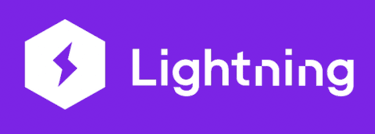

> Complete a [15 minutes tutorial](https://lightning.ai/docs/pytorch/latest/starter/introduction.html).

----------------


In [67]:
class ViT(pl.LightningModule):

    def __init__(self, model_kwargs, lr):
        super().__init__()
        self.save_hyperparameters()
        self.model = VisionTransformer(**model_kwargs)
        self.example_input_array = next(iter(train_loader))[0]


    def forward(self, x):
        return self.model(x)

    def configure_optimizers(self):
        optimizer = optim.AdamW(self.parameters(), lr=self.hparams.lr)
        lr_scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[100, 150], gamma=0.1)
        return [optimizer], [lr_scheduler]

    def _calculate_loss(self, batch, mode="train"):
        imgs, labels = batch
        preds = self.model(imgs)
        loss = F.cross_entropy(preds, labels)
        acc = (preds.argmax(dim=-1) == labels).float().mean()

        self.log("%s_loss" % mode, loss, on_epoch=True, prog_bar=True)
        self.log("%s_acc" % mode, acc, on_epoch=True, prog_bar=True)
         # logging using tensorboard logger
        self.logger.experiment.add_scalar("%s_acc" % mode,
                                            acc,
                                            self.current_epoch)
        return loss

    def training_step(self, batch, batch_idx):
        loss = self._calculate_loss(batch, mode="train")
        return loss

    def validation_step(self, batch, batch_idx):
        self._calculate_loss(batch, mode="val")

    def test_step(self, batch, batch_idx):
        self._calculate_loss(batch, mode="test")

## Configure the Training Process:  

There is a pre-trained Vision Transformer available for downloading or, it is possible to train the ViT model from the scratch.

In [68]:
"""
usePreTrained = False will train the model as scratch
usePreTrained = True will download and load an existing model
"""
usePreTrained = False

if usePreTrained:
  !wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=131FuhIBrQ-lujR1CDKG9RAXxO-3KheBs' -O ViT_Original.zip
  !cp ViT_Original.zip /content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/
  !unzip ViT_Original.zip -d /content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/
else:
  !mkdir /content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/ViT_Original
  !mkdir /content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/ViT_Original/tensorboards
  !mkdir /content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/ViT_Original/tensorboards/ViT


mkdir: cannot create directory ‘/content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/ViT_Original’: File exists
mkdir: cannot create directory ‘/content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/ViT_Original/tensorboards’: File exists
mkdir: cannot create directory ‘/content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/ViT_Original/tensorboards/ViT’: File exists


## Training the ViT

In [69]:
def train_model(**kwargs):
    trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, "ViT"),
                         accelerator="auto" if str(device).startswith("cuda") else "cpu",
                         devices=1,
                         max_epochs=4,
                         callbacks=[
                            ModelCheckpoint(filename='{epoch}-{train_loss:.2f}-{val_loss:.2f}',
                                            save_weights_only=False, mode="max", monitor="val_acc", verbose=True),
                            LearningRateMonitor("epoch")])


    trainer.logger._log_graph = True         # If True, we plot the computation graph in tensorboard
    trainer.logger._default_hp_metric = None # Optional logging argument that we don't need

    # Check whether pretrained model exists. If yes, load it and skip training
    pretrained_filename = os.path.join(CHECKPOINT_PATH, "ViT.ckpt")
    if os.path.isfile(pretrained_filename):
        print(f"Found pretrained model at {pretrained_filename}, loading...")
        model = ViT.load_from_checkpoint(pretrained_filename) # Automatically loads the model with the saved hyperparameters
    else:
        pl.seed_everything(42) # To be reproducable
        model = ViT(**kwargs)
        trainer.fit(model, train_loader, val_loader)
        model = ViT.load_from_checkpoint(trainer.checkpoint_callback.best_model_path) # Load best checkpoint after training

    # Test best model on validation and test set
    val_result = trainer.test(model, val_loader, verbose=False)
    test_result = trainer.test(model, test_loader, verbose=False)
    result = {"test": test_result[0]["test_acc"], "val": val_result[0]["test_acc"]}

    return model, result


In [72]:
model, results = train_model(model_kwargs={
                                'embed_dim': 256,
                                'hidden_dim': 512,
                                'num_heads': 8,
                                'num_layers': 6,
                                'patch_size': 4,
                                'num_channels': 3,
                                'num_patches': 64,
                                'num_classes': 10,
                                'dropout': 0.2
                            },
                            lr=3e-4)
print("ViT results", results)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:lightning_fabric.utilities.seed:Global seed set to 42
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type              | Params | In sizes         | Out sizes
---------------------------------------------------------------------------
0 | model | VisionTransformer | 3.2 M  | [128, 3, 32, 32] | [128, 10]
---------------------------------------------------------------------------
3.2 M     Trainable params
0         Non-trainable params
3.2 M     Total params
12.781    Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

AttributeError: ignored

> $\color{red}{Important \text{ } Note:}$ if you are **trainning the model from scratch**, then follow these instructions at the end:

 1. Go to Folder '/content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/ViT_Original/ViT/lightning_logs/'
 2. Multiple folders can appear.  Select the last version (with large number). We will call this folder 'version_X'
 3. On "version_X/checkpoints/", move the file with extension 'XX.ckpt' to '/content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/ViT_Original/'
 4. Rename this file 'XX.ckpt' to 'ViT.ckpt'
 5. On "version_X/
 6. Move the file with extension 'events.out.tfevents.XXX.XXX.XXX' to '/content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/ViT_Original/tensorboards/ViT/'
 7. Rename this file 'events.out.tfevents.XXX.XXX.XXX' to 'events.out.tfevents.ViT'

> Otherwise, please ignore the previous instructions.


In [54]:
# Opens tensorboard in notebook. Adjust the path to your CHECKPOINT_PATH!
%tensorboard --logdir /content/gdrive/MyDrive/CV_MEEC_2223/ViT_Data/ViT_Original/tensorboards/

Reusing TensorBoard on port 6006 (pid 7625), started 0:08:32 ago. (Use '!kill 7625' to kill it.)

<IPython.core.display.Javascript object>

-------------
# Exercise


------------

---------------

# Final remarks

ViT's success can be attributed to its ability to capture global context by leveraging self-attention and its flexibility in handling images of arbitrary sizes. It has achieved remarkable results on several image recognition benchmarks and has demonstrated strong transfer learning capabilities. However, it is worth noting that ViT's reliance on self-attention for modeling relationships between patches can be computationally expensive, especially for high-resolution images.

ViT offers several advantages over CNN-based models, which have long been the dominant approach in the field:

1. Global Contextual Understanding: CNN-based models typically operate locally by capturing information from small receptive fields and aggregating features hierarchically. In contrast, visual transformers can capture global dependencies and context by leveraging the self-attention mechanism. This allows transformers to consider relationships between all spatial locations in the image, enabling better understanding of long-range dependencies and capturing global context.

2. Flexibility in Image Sizes: Transformers can process images in a patch-wise manner, splitting them into smaller patches, and then use self-attention to model relationships between patches. This flexibility allows transformers to handle images of varying resolutions without the need for resizing or cropping, making them suitable for tasks where maintaining fine-grained spatial information is crucial.

3. Hierarchical Representation Learning: Visual transformers can capture both local and global information effectively. By stacking multiple transformer layers, the model can learn hierarchical representations of the input image, just like CNNs. However, transformers have shown advantages in capturing relationships between objects and semantic structures across different scales due to their attention mechanism. This enables them to capture fine-grained details and high-level semantic information simultaneously, leading to more robust and comprehensive representations.

4. Enhanced Interpretability: Transformers offer improved interpretability compared to CNN-based models. The attention weights computed during the self-attention process provide insights into which parts of the image contribute more to the final predictions. This attention map can be visualized, helping to understand the model's decision-making process. In contrast, CNN-based models are often regarded as black boxes, making it challenging to interpret their predictions.

5. Transfer Learning and Generalization: Visual transformers have demonstrated strong transfer learning capabilities. Pre-training transformers on large-scale datasets, such as ImageNet, and fine-tuning them on specific downstream tasks has yielded impressive results. The pre-trained models capture rich visual representations that can be adapted to various tasks, reducing the need for extensive task-specific data. This transfer learning ability allows transformers to generalize well across different domains and tasks.

6. End-to-End Training: CNN-based models often require multi-stage pipelines that involve hand-crafted feature extraction followed by a classifier. Visual transformers, however, can be trained end-to-end, eliminating the need for such manual feature engineering. The self-attention mechanism allows transformers to learn both spatial and semantic relationships in an integrated manner, enabling seamless end-to-end training and optimization.

While visual transformers have showcased great potential, CNN-based models still excel in some scenarios, particularly when dealing with smaller datasets or tasks where local features are crucial, such as object detection in cluttered scenes. ViTs require significant computational resources compared to traditional Convolutional Neural Networks (CNNs). The self-attention mechanism used in transformers is computationally expensive, especially for large images with high-resolution patches. This can make training and inference slower, limiting the scalability of ViTs.





--------------------------------
# References

[1] Conditional Random Fields as Recurrent Neural Networks

[2] Kishore and Reddy, A modern computer vision with Pytorch, Packt, 2020.




Some tutorials that are also interesting:

[Transformer: A Novel Neural Network Architecture for Language Understanding](https://ai.googleblog.com/2017/08/transformer-novel-neural-network.html) (Jakob Uszkoreit, 2017) - The original Google blog post about the Transformer paper, focusing on the application in machine translation.

[The Illustrated Transformer](http://jalammar.github.io/illustrated-transformer/) (Jay Alammar, 2018) - A very popular and great blog post intuitively explaining the Transformer architecture with many nice visualizations. The focus is on NLP.

[Attention? Attention!](https://lilianweng.github.io/lil-log/2018/06/24/attention-attention.html)  (Lilian Weng, 2018) - A nice blog post summarizing attention mechanisms in many domains including vision.

[Illustrated: Self-Attention](https://towardsdatascience.com/illustrated-self-attention-2d627e33b20a) (Raimi Karim, 2019) - A nice visualization of the steps of self-attention. Recommended going through if the explanation below is too abstract for you.

[The Transformer family ](https://lilianweng.github.io/lil-log/2020/04/07/the-transformer-family.html)(Lilian Weng, 2020) - A very detailed blog post reviewing more variants of Transformers besides the original one.

1. Split Image into Patches
The input image is split into N patches (N = 14 x 14 for ViT-Base) and converted to D=768 embedding vectors by learnable 2D convolution: